In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image,ImageEnhance
from torchvision import transforms
import torch
import torch.nn as nn
import os
from tqdm import tqdm


In [2]:
def occlude(img, x, y, w = 50, h = 50, rgb = (80,80,80)):
    img[x:x + w,y:y + h] = rgb
    return img
    

In [3]:
preprocess1 = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
    ])
preprocess2 = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')


ModuleNotFoundError: No module named 'google.colab'

In [7]:
%cd /content/gdrive/My\ Drive/
# !ls /content/gdrive/My\ drive/occlusion/n02091134_2235.jpg

/content/gdrive/My Drive


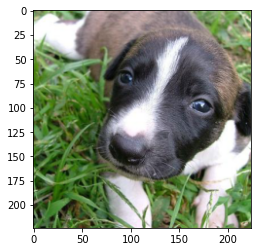

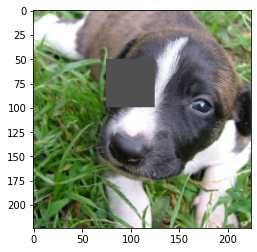

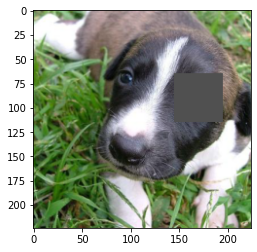

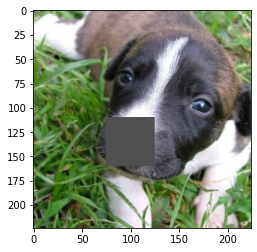

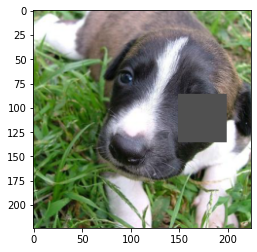

...

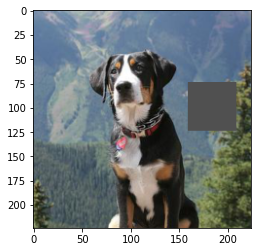

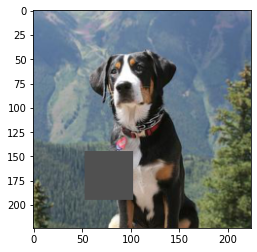

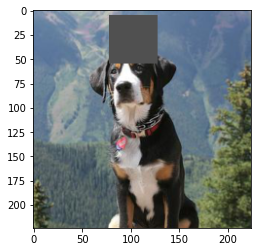

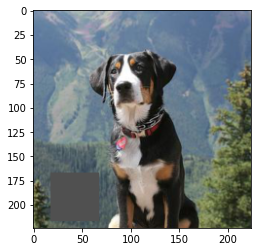

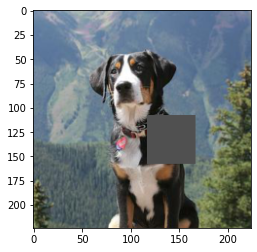

In [4]:
input_image_names = ['n02091134_2235.jpg', 'n02096177_91.jpg', 'n02101556_3100.jpg', 'n02106030_3948.jpg', 'n02107574_322.jpg']
left_eye_boxes = [[50,75], [10,50], [50,35], [30,75], [30,50]]
right_eye_boxes = [[65,145], [10,100], [50,125], [50,125], [30,100]]
nose_boxes = [[110,75], [50,70], [125,75], [125,100], [75,75]]
images = np.zeros((5,9,224,224,3))
for i, img in enumerate(input_image_names):
    input_image = Image.open(f'occlusion/{img}')
    input_tensor = preprocess1(input_image)
    input_batch = input_tensor.unsqueeze(0)
    orig_img = np.asarray(transforms.ToPILImage()(input_batch[0]).convert("RGB"), dtype=np.uint8)
    left_eye_img =  orig_img.copy()
    right_eye_img =  orig_img.copy()
    nose_img =  orig_img.copy()
    left_eye_img =  occlude(left_eye_img, left_eye_boxes[i][0], left_eye_boxes[i][1], 50, 50, (80,80,80))
    right_eye_img =  occlude(right_eye_img, right_eye_boxes[i][0], right_eye_boxes[i][1], 50, 50, (80,80,80))
    nose_img =  occlude(nose_img, nose_boxes[i][0], nose_boxes[i][1], 50, 50, (80,80,80))
#     left_eye_img[left_eye_boxes[i][0]:left_eye_boxes[i][0] + 50,left_eye_boxes[i][1]:left_eye_boxes[i][1] + 50] = (80,80,80)
#     right_eye_img[right_eye_boxes[i][0]:right_eye_boxes[i][0] + 50,right_eye_boxes[i][1]:right_eye_boxes[i][1] + 50] = (80,80,80)
#     nose_img[nose_boxes[i][0]:nose_boxes[i][0] + 50,nose_boxes[i][1]:nose_boxes[i][1] + 50] = (80,80,80)
    images[i,0,:,:,:] = orig_img
    images[i,1,:,:,:] = left_eye_img
    images[i,2,:,:,:] = right_eye_img
    images[i,3,:,:,:] = nose_img
    for j in range(5):
        x, y = np.random.randint(0, 223 - 50), np.random.randint(0, 223 - 50)
        new_img =  orig_img.copy()
        new_img = occlude(new_img, x, y, 50, 50, (80,80,80))
        images[i,4+j,:,:,:] = new_img

images_pil = []
        
for i in range(5):
    images_pil.append([])
    for j in range(9):
        new_img = images[i,j]
        images_pil[i].append(Image.fromarray(images[i,j].astype('uint8')))
        plt.imshow(new_img.astype('uint8'))
        plt.show()

In [5]:
%run vgg.py

In [6]:
input_batches = []
for i in range(5):
    for j in range(9):
        input_tensor = preprocess2(images_pil[i][j])
        input_batch = input_tensor.unsqueeze(0)
        input_batches.append(input_batch)
        transforms.ToPILImage()(input_tensor).convert("RGB")

In [7]:
class Deconv(nn.Module):
  def __init__(self,model):
    super().__init__()
    self.model = model
    self.layer_counter = 0
    self.pass_forward = 0

  def forward_one_layer(self,x,indices):
    # print('At layer ',self.layer_counter)
    layer, rev_layer = self.model.features[self.layer_counter],self.model.rev_features[self.layer_counter]
    if layer._get_name()=='MaxPool2d':
      y,switches = layer(x)
    else:
      y,switches = layer(x),None
    
    
    back_input=[]
    for ind in indices:
      new_y = y[0].detach().clone()
      new_y = torch.stack([i if index==ind else torch.zeros_like(i) for index,i in enumerate(new_y)],axis=0)
      back_input.append(new_y)
    back_input = torch.stack(back_input,axis=0)

    if self.pass_forward==0:
      if switches is not None:
        switches = switches[0].repeat(len(indices),1,1,1)
        return rev_layer(back_input,switches)
      return rev_layer(back_input)
    
    self.layer_counter+=1
    self.pass_forward-=1
    propogating_back_input = self.forward_one_layer(y,indices)

    total_back_input = torch.cat([back_input,propogating_back_input],axis = 0)
    if switches is not None:
      switches = switches[0].repeat(total_back_input.shape[0],1,1,1)
      return rev_layer(total_back_input,switches)
    return rev_layer(total_back_input)

  def get_norms(self,x):
    layer, rev_layer = self.model.features[self.layer_counter],self.model.rev_features[self.layer_counter]
    if layer._get_name()=='MaxPool2d':
      y,switches = layer(x)
    else:
      y,switches = layer(x),None
    
    back_input=[[i.norm().cpu().numpy() for i in y[0]]]
    if self.pass_forward==0:
      return back_input
    self.layer_counter+=1
    self.pass_forward-=1
    back_input.extend(self.get_norms(y))
    return back_input

  def forward(self,x,num_layers = 1,indices = None):
    self.pass_forward = num_layers -1
    self.layer_counter = 0
    with torch.no_grad():
      if indices is None:
        return self.get_norms(x)
      viss = self.forward_one_layer(x,indices)
    return viss.cpu()
    
# dvgg = Deconv(an)
dvgg = Deconv(vgg16)
indices= [12,57,41]
# dvgg(input_batches[0],1, indices)
out = dvgg(input_batches[0],4)
for i in range(len(out)):
  print(np.argmax(np.array(out[i])))


12
57
41
41


In [29]:
!wget https://s3.amazonaws.com/fast-ai-imageclas/imagenette2-320.tgz

--2021-12-01 14:13:51--  https://s3.amazonaws.com/fast-ai-imageclas/imagenette2-320.tgz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.216.109.133
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.216.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 341663724 (326M) [application/x-tar]
Saving to: ‘imagenette2-320.tgz’

imagenette2-320.tgz 100%[===================>] 325.83M  6.89MB/s    in 48s     

2021-12-01 14:14:41 (6.72 MB/s) - ‘imagenette2-320.tgz’ saved [341663724/341663724]



In [30]:
!tar -xzf imagenette2-320.tgz

In [21]:
def get_input_image(filename='test_image.jpg'):
  input_image = Image.open(filename)#('/content/Images/n02089867-Walker_hound/n02089867_1105.jpg')
  preprocess = transforms.Compose([
      transforms.Resize(256),
      transforms.CenterCrop(224),
      transforms.ToTensor(),
      # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  # Try with and without normalizing
  input_tensor = preprocess(input_image)
  input_batch = input_tensor.unsqueeze(0)
  return input_batch

class topk():
  def __init__(self,k=9):
    self.keys = [-1 for i in range(k)]
    self.cmp_order = np.argsort(self.keys)
    self.values = [None for i in range(k)]
    self.ims = [None for i in range(k)]
  def add(self,element,im):
    curr_key = np.abs(element.norm())
    self.min = np.argmin(self.keys)
    for i in self.cmp_order:
      if self.keys[i]<=curr_key:
        self.keys[i]=curr_key
        self.values[i] = element
        self.ims[i] = im
        break
    self.cmp_order = np.argsort(self.keys)

max_num=5
num_layers=4
all_visses = [topk(max_num) for i in range(num_layers*len(indices))]
rem_files = []
all_files=os.listdir('imagenette2-320/train/n02102040')
# print(all_files)
for i in tqdm(all_files):
  try:
    
    input_batch = get_input_image(f'imagenette2-320/train/n02102040/{i}')
    inp = transforms.ToPILImage()(input_batch[0]).convert("RGB")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_batch = input_batch.to(device)
    dvgg.to(device)
    
    visses = dvgg(input_batch,num_layers,indices)
    # print(visses[13].norm())
  except Exception as e:
    print(e,'File ',i,' is not proper')
    rem_files.append(i)
    continue
  [top.add(curr,inp) for curr,top in zip(visses,all_visses)]

# for i in range(5):
#   try:
    
#     input_batch = input_batches[i*5]
#     inp = images_pil[i][0]
#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#     input_batch = input_batch.to(device)
#     dvgg.to(device)
    
#     visses = dvgg(input_batch,num_layers,indices)
#     # print(visses[13].norm())
#   except Exception as e:
#     print(e,'File ',i,' is not proper')
#     rem_files.append(i)
#     continue
#   [top.add(curr,inp) for curr,top in zip(visses,all_visses)]



 53%|█████▎    | 500/951 [00:14<00:12, 36.99it/s]

Given groups=1, weight of size [64, 3, 3, 3], expected input[1, 1, 224, 224] to have 3 channels, but got 1 channels instead File  n02102040_173.JPEG  is not proper


 63%|██████▎   | 596/951 [00:17<00:10, 35.44it/s]

Given groups=1, weight of size [64, 3, 3, 3], expected input[1, 1, 224, 224] to have 3 channels, but got 1 channels instead File  n02102040_598.JPEG  is not proper


 84%|████████▍ | 797/951 [00:22<00:04, 36.67it/s]

Given groups=1, weight of size [64, 3, 3, 3], expected input[1, 1, 224, 224] to have 3 channels, but got 1 channels instead File  n02102040_3183.JPEG  is not proper


 88%|████████▊ | 838/951 [00:23<00:03, 36.70it/s]

Given groups=1, weight of size [64, 3, 3, 3], expected input[1, 1, 224, 224] to have 3 channels, but got 1 channels instead File  n02102040_7646.JPEG  is not proper


 90%|████████▉ | 855/951 [00:24<00:02, 36.86it/s]

Given groups=1, weight of size [64, 3, 3, 3], expected input[1, 1, 224, 224] to have 3 channels, but got 1 channels instead File  n02102040_1408.JPEG  is not proper


100%|██████████| 951/951 [00:27<00:00, 35.11it/s]


At layer 1 feature map 0


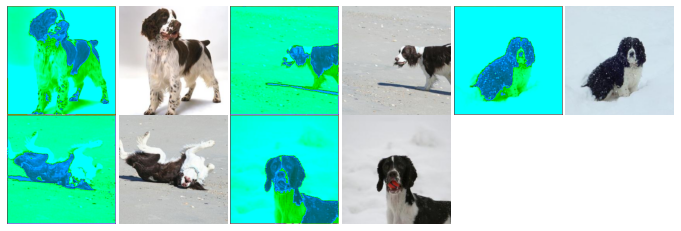

At layer 1 feature map 1


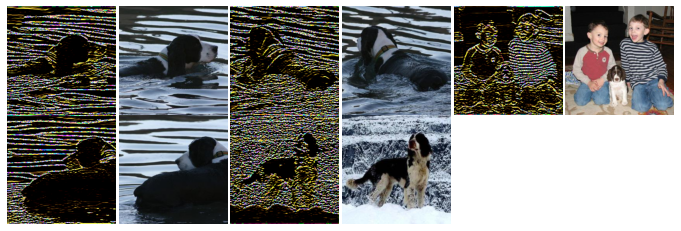

At layer 1 feature map 2


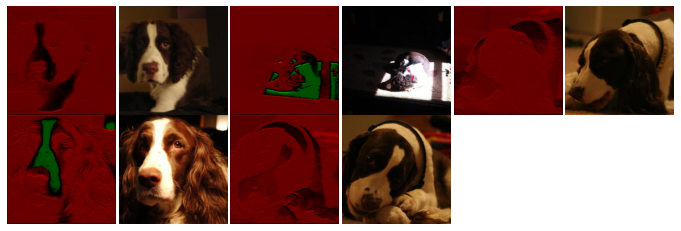

At layer 2 feature map 0


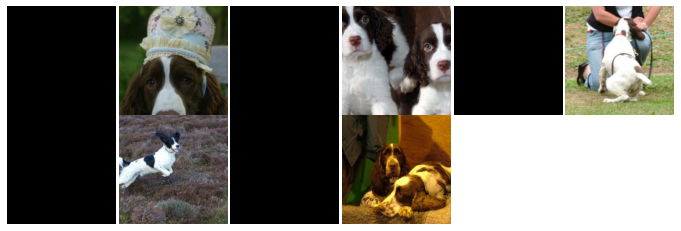

At layer 2 feature map 1


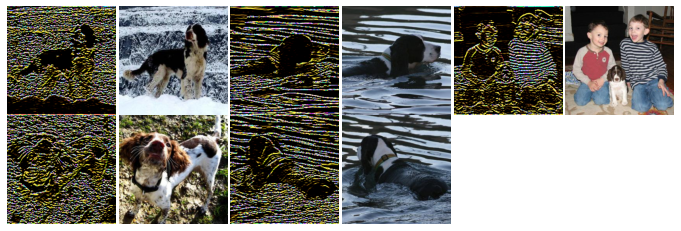

At layer 2 feature map 2


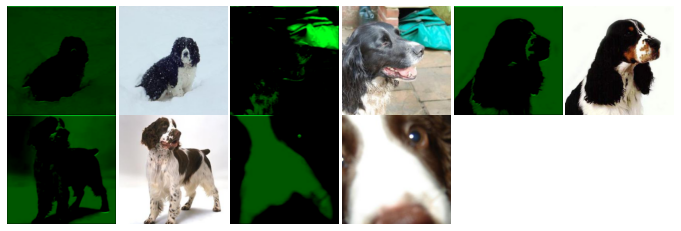

At layer 3 feature map 0


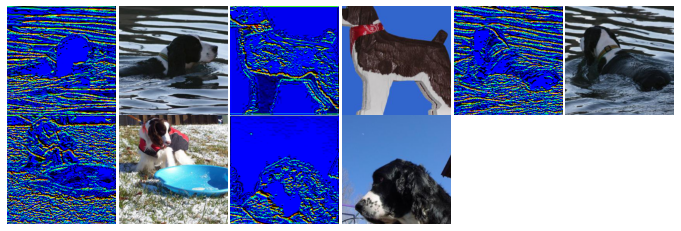

At layer 3 feature map 1


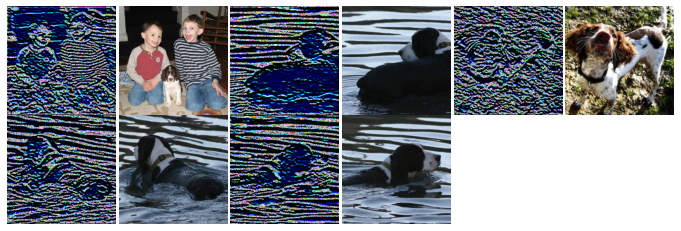

At layer 3 feature map 2


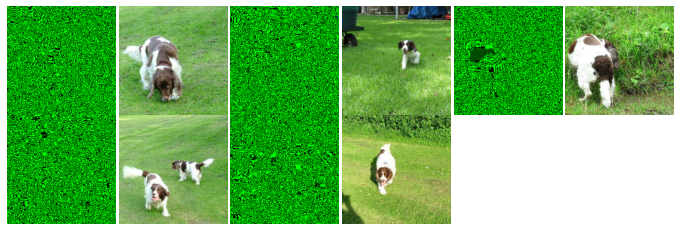

At layer 4 feature map 0


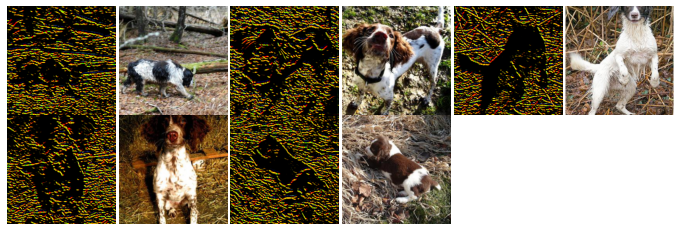

At layer 4 feature map 1


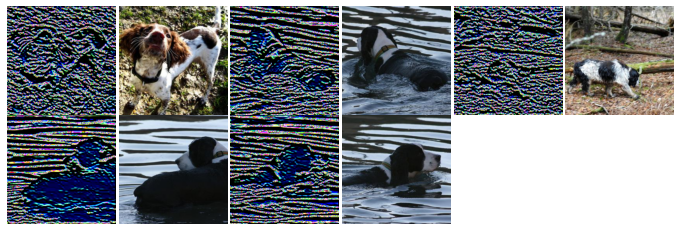

At layer 4 feature map 2


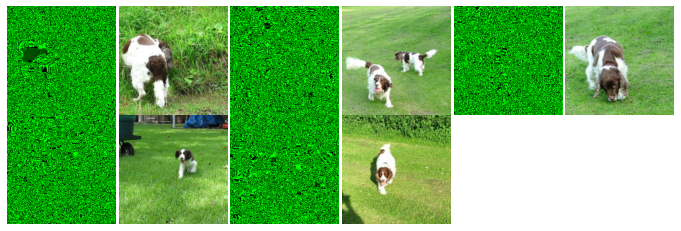

In [22]:
for index,im in enumerate(all_visses):
  print(f'At layer {1+(index//len(indices))} feature map {index%len(indices)}')
  plt.figure(figsize=(12,12))
  for i,(vis,img) in enumerate(zip(im.values,im.ims)):
    plt.subplot(6,6,2*i+1)
    # Try out various clipping/normalization methods
    vis_mean = transforms.ToPILImage()(vis.clamp(min=0)).convert("RGB")
    # ToDo try out various enhancing methods
    enhancer = ImageEnhance.Contrast(vis_mean)
    factor = 2
    enh_vis_mean = enhancer.enhance(factor)
#     print(enh_vis_mean)
#     orig_img = np.asarray(enh_vis_mean, dtype=np.uint8)
#     nw_img = Image.fromarray((1.0-orig_img).astype('uint8'))
    plt.imshow(enh_vis_mean)
    plt.axis('off')

    plt.subplot(6,6,2*i+2)
    plt.imshow(img)
    plt.axis('off')
  plt.subplots_adjust(wspace=0, hspace=0)
  plt.show()

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'alexnet', pretrained=True)
model.eval()

Using cache found in /home/vamsheedar/.cache/torch/hub/pytorch_vision_v0.10.0


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [69]:
class Alex(torch.nn.Module):
    def __init__(self):
        super(Alex, self).__init__()
        pretrained = torch.hub.load('pytorch/vision:v0.10.0', 'alexnet', pretrained=True)
        features = list(pretrained.features)
        classifier = list(pretrained.classifier)
        self.features = nn.ModuleList(features).eval() 
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.ModuleList(classifier).eval() 
        
    def forward(self, x):
        self.results = []
        for ii,model in enumerate(self.features):
            x = model(x)
            if ii in {2,5,7,9,12}:
#                 print(ii, x.shape)
                self.results.append(x.detach().numpy())
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        for ii,model in enumerate(self.classifier):
            x = model(x)
#             print(ii, x.shape)
#             if ii in {2,5,7,9,12}:
#                 self.results.append(x.detach().numpy())
        return x, self.results

In [70]:
alex = Alex()

Using cache found in /home/vamsheedar/.cache/torch/hub/pytorch_vision_v0.10.0


In [71]:
alex, alex(input_batches[0])

(Alex(
   (features): ModuleList(
     (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
     (1): ReLU(inplace=True)
     (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
     (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
     (4): ReLU(inplace=True)
     (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
     (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (7): ReLU(inplace=True)
     (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (9): ReLU(inplace=True)
     (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (11): ReLU(inplace=True)
     (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
   )
   (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
   (classifier): ModuleList(
     (0): Dropout(p=0.5, inplace=False)
     (1): Linear(in_features=9216, out_features=4

In [72]:
alex(input_batches[0])[0][0], torch.nn.functional.softmax(alex(input_batches[0])[0][0], dim=0)

(tensor([ 1.2224e+00, -5.4210e+00, -2.7916e+00, -2.1295e+00, -1.7963e+00,
         -2.1473e+00,  1.1824e-01, -2.1432e+00,  1.8427e-01, -6.5538e+00,
          1.6631e-01, -2.9045e+00, -3.6887e+00,  1.2872e+00, -1.8605e+00,
          1.9093e-01,  1.2431e+00, -1.5487e+00,  7.2086e+00,  6.9368e-01,
          9.8763e-01, -1.3919e+00, -3.1124e+00,  3.9242e+00, -1.0144e+00,
          1.5818e+00, -1.0825e-01, -1.7302e+00,  8.2150e-01, -5.1891e-01,
         -2.1676e-02, -2.8649e+00,  7.1087e-01,  2.1409e-01, -1.3429e-01,
          2.5204e+00,  7.0701e+00,  1.8965e+00,  8.0353e-01, -7.6470e-01,
         -1.8018e+00, -3.9750e+00, -1.5763e+00,  6.8189e-01, -3.2444e+00,
         -6.5894e-01, -2.0087e+00, -9.6629e-01, -3.5810e-01, -2.8406e+00,
         -3.7061e+00, -1.0345e+00, -1.6195e+00, -1.5635e+00,  2.4300e+00,
         -1.6075e+00,  1.2688e+00, -3.7863e+00, -2.6315e+00, -2.5583e+00,
         -1.1817e+00,  1.0009e+00,  9.3205e-01,  2.2884e-01, -1.1196e+00,
         -9.8833e-01, -2.2728e+00, -2.

In [ ]:
!mkdir -p models/alexnet && wget https://download.pytorch.org/models/alexnet-owt-7be5be79.pth -O models/alexnet/model.pth

--2021-12-01 05:48:18--  https://download.pytorch.org/models/alexnet-owt-7be5be79.pth
Resolving download.pytorch.org (download.pytorch.org)... 13.224.160.39, 13.224.160.7, 13.224.160.98, ...
Connecting to download.pytorch.org (download.pytorch.org)|13.224.160.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244408911 (233M) [application/x-www-form-urlencoded]
Saving to: ‘models/alexnet/model.pth’

models/alexnet/mode 100%[===================>] 233.09M  48.8MB/s    in 5.0s    

2021-12-01 05:48:23 (46.8 MB/s) - ‘models/alexnet/model.pth’ saved [244408911/244408911]



In [ ]:
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt

--2021-11-30 10:23:30--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt.7’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0.001s  

2021-11-30 10:23:30 (7.63 MB/s) - ‘imagenet_classes.txt.7’ saved [10472/10472]



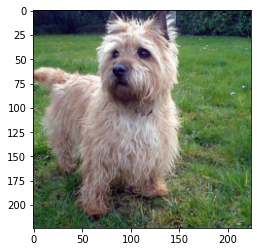

In [68]:
plt.imshow(images[1][0].astype('uint8'))
plt.show()

In [40]:
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]
def run_alex_from_np_img(img):
    img_pil = Image.fromarray(img.astype('uint8'))
    input_tensor = preprocess2(img_pil)
    input_batch = input_tensor.unsqueeze(0)
    probs = torch.nn.functional.softmax(alex(input_batch)[0][0], dim=0)
    top5_prob, top5_catid = torch.topk(probs, 5)
#     print(top5_catid)
#     for i in range(top5_prob.size(0)):
#         print(categories[top5_catid[i]], top5_prob[i].item())
    return top5_prob, top5_catid, probs

def run_model_from_np_img(model, img,  *args):
    img_pil = Image.fromarray(img.astype('uint8'))
    input_tensor = preprocess2(img_pil)
    input_batch = input_tensor.unsqueeze(0)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    input_batch = input_batch.to(device)
    model.to(device)
    out = model(input_batch, *args)
    probs = torch.nn.functional.softmax(out[0][0], dim=0)
    top5_prob, top5_catid = torch.topk(probs, 5)
#     print(top5_catid)
#     for i in range(top5_prob.size(0)):
#         print(categories[top5_catid[i]], top5_prob[i].item())
    return top5_prob, top5_catid, probs, out


In [41]:
categories = np.array(categories)
print(np.argwhere(categories=='whippet'))
print(np.argwhere(categories=='cairn'))
print(np.argwhere(categories=='clumber'))
print(np.argwhere(categories=='collie'))
print(np.argwhere(categories=='Greater Swiss Mountain dog'))
# categories

[[172]]
[[192]]
[[216]]
[[231]]
[[238]]


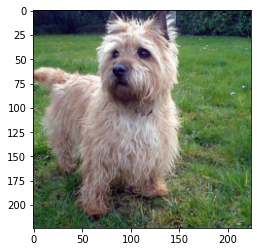

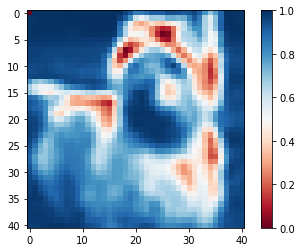

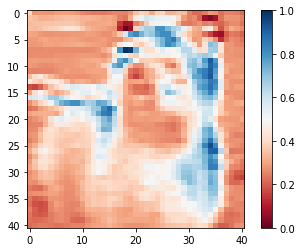

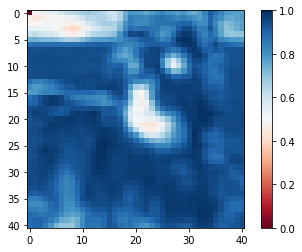

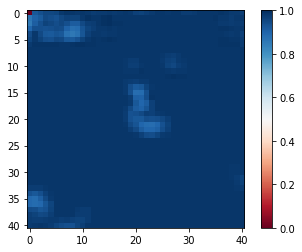

...

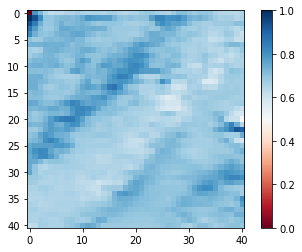

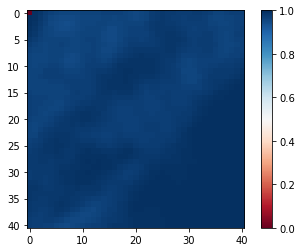

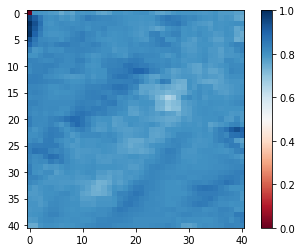

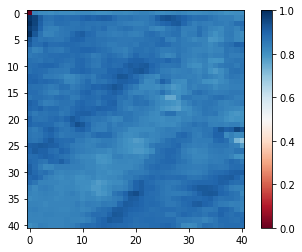

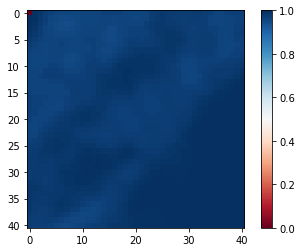

In [65]:
def plot_occlusion_plots(img, k = 64, stride = 4, classnum=192):
    op_size = ((224-k)//stride)+1
    heatmap = np.zeros((op_size, op_size))
    top5_catids=np.zeros((op_size, op_size))
    top5_catid_labels = []
    feature_heatmap  = np.zeros((12, op_size, op_size))
    for i in range(op_size):
        for j in range(op_size):
            new_img = img.copy()
    #         new_img = images[2][0].copy()
            new_img = occlude(new_img, stride*i, stride*j, k, k)
#             aa,bb,cc = run_alex_from_np_img(new_img)
            aa,bb,cc, visses = run_model_from_np_img(dvgg,new_img,4,indices)
#             visses = dvgg(input_batch,num_layers,indices)
#             print(len(visses),len(visses[0]),len(visses[0][0]),  len(visses[0][0][0]))
            for k in range(len(visses)):
#                 print(np.max(np.array(visses[k])))
                feature_heatmap[k][i][j] = np.linalg.norm(np.array(visses[k]))
        
            
#             print(bb)
#             heatmap[i][j] = cc[classnum]
#             top5_catids[i][j] = bb[0]
#             top5_catid_labels.append(bb[0])
    #         plt.imshow(new_img.astype('uint8'))
    #         plt.show()
#     top5_catid_labels = np.array([categories[x] for x in top5_catid_labels])
    plt.imshow(img.astype('uint8'))
    plt.show()
    for i in range(12):
        fmp = feature_heatmap[i,:,:].copy()
        fmin = fmp.min()
        fmax = fmp.max()
        fmp-=fmp.min()
        fmp /= (fmax-fmin)
        
        plt.imshow(fmp, cmap='RdBu')
        plt.colorbar()
        plt.show()
#     plt.imshow(heatmap, cmap='RdBu')
#     plt.colorbar()
#     plt.show()
#     plt.imshow(top5_catids, cmap='RdBu')
#     plt.legend(np.unique(top5_catid_labels))
#     plt.colorbar()
#     plt.show()
#     print(np.unique(top5_catids))

# for i in range(5):
#   for j in range(9):
#     input_batch = input_batches[i*5+j]
#     inp = images_pil[i][j]
# #     inp = transforms.ToPILImage()(input_batch[0]).convert("RGB")
#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#     input_batch = input_batch.to(device)
#     dvgg.to(device)
    
#     visses = dvgg(input_batch,num_layers,indices)
#     print(out)
#     for i in range(len(out)):
#         print(i,len(out), len(out[i]))
# #         out[i]np.argmax(np.array(out[i]))
#     # print(visses[13].norm())
# #     except Exception as e:
# #       print(e,'File ',i,' is not proper')
# #       rem_files.append(i)
# #       continue
#     [top.add(curr,inp) for curr,top in zip(visses,all_visses)]
plot_occlusion_plots(images[1][0],classnum=192)
plot_occlusion_plots(images[2][0],classnum=192)
plot_occlusion_plots(images[3][0],classnum=192)
plot_occlusion_plots(images[4][0],classnum=192)
plot_occlusion_plots(images[0][0],classnum=192)
for i in range(len(input_label_names)):
    plot_occlusion_plots(new_images[i][0],classnum=192)

In [115]:
import matplotlib.patches as mpatches
from sklearn.preprocessing import LabelEncoder

def plot_occlusion_plots(img, k = 64, stride = 4, classnum=192):
    op_size = ((224-k)//stride)+1
    heatmap = np.zeros((op_size, op_size))
    top5_catids=np.zeros((op_size, op_size))
    top5_catid_labels = []
    for i in range(op_size):
        for j in range(op_size):
            new_img = img.copy()
    #         new_img = images[2][0].copy()
            new_img = occlude(new_img, stride*i, stride*j, k, k)
            aa,bb,cc = run_alex_from_np_img(new_img)
#             print(bb)
            heatmap[i][j] = cc[classnum]
            top5_catids[i][j] = bb[0]
            top5_catid_labels.append(bb[0])
    #         plt.imshow(new_img.astype('uint8'))
    #         plt.show()
    top5_catid_labels = np.array([categories[x] for x in top5_catid_labels])
    plt.imshow(img.astype('uint8'))
    plt.show()
    plt.imshow(heatmap, cmap='RdBu')
    plt.colorbar()
    plt.show()
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(top5_catids.copy().flatten()).reshape(top5_catids.shape)
#     y /= np.max(y)
#     labeller = np.vectorize(label_encoder.transform)
#     im = plt.imshow(top5_catids, cmap='RdBu')
    im = plt.imshow(y)
#     plt.legend(np.unique(top5_catid_labels))
#     plt.colorbar()
    values=np.unique(y)
    print(values)
    labels=categories[label_encoder.inverse_transform(values).astype(int)]
    colors = [ im.cmap(im.norm(value)) for value in values]
    patches = [ mpatches.Patch(color=colors[i], label=labels[i] ) for i in range(len(values)) ]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )

#     plt.grid(True)
#     cb.set_ticks(np.arange(np.unique(top5_catid_labels).shape[0]))
#     cb.set_ticklabels(np.unique(top5_catid_labels))
    plt.show()
    print(np.unique(top5_catids), np.unique(top5_catid_labels))

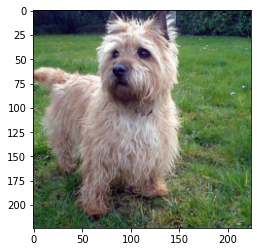

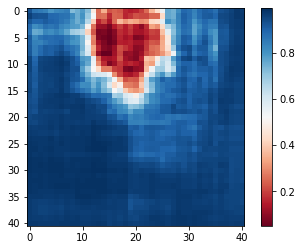

[0 1 2 3 4 5 6]


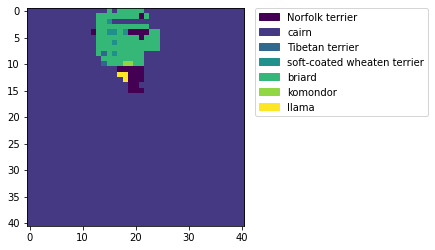

[185. 192. 200. 202. 226. 228. 355.] ['Norfolk terrier' 'Tibetan terrier' 'briard' 'cairn' 'komondor' 'llama'
 'soft-coated wheaten terrier']


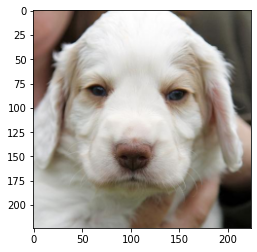

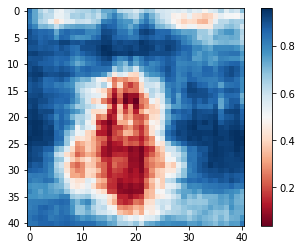

[0 1 2 3 4 5 6]


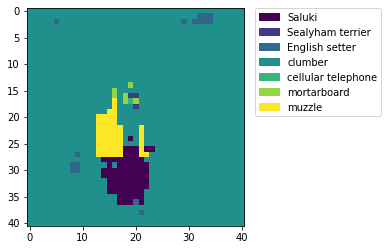

[176. 190. 212. 216. 487. 667. 676.] ['English setter' 'Saluki' 'Sealyham terrier' 'cellular telephone'
 'clumber' 'mortarboard' 'muzzle']


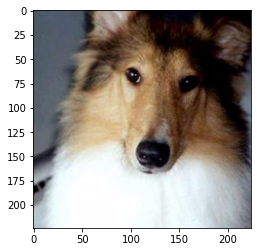

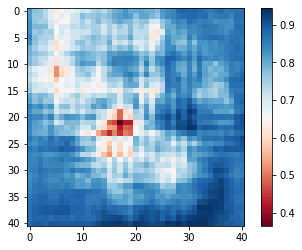

[0 1]


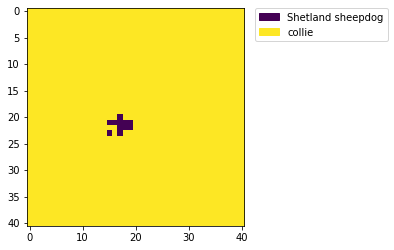

[230. 231.] ['Shetland sheepdog' 'collie']


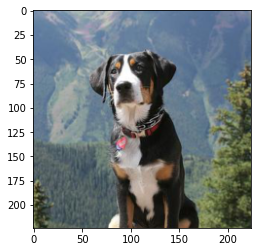

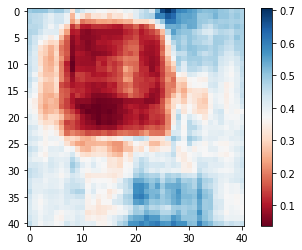

[0 1 2]


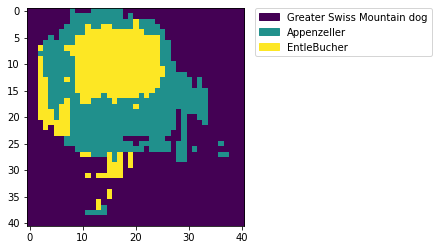

[238. 240. 241.] ['Appenzeller' 'EntleBucher' 'Greater Swiss Mountain dog']


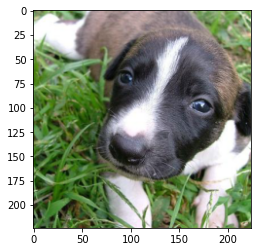

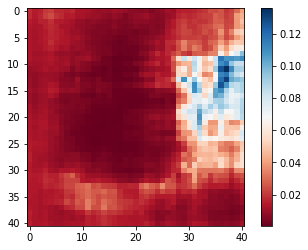

[0 1 2 3 4 5]


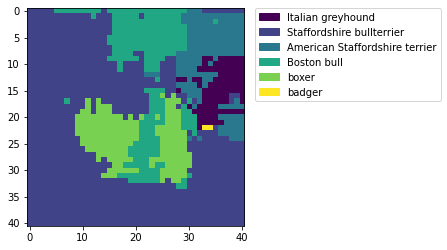

[171. 179. 180. 195. 242. 362.] ['American Staffordshire terrier' 'Boston bull' 'Italian greyhound'
 'Staffordshire bullterrier' 'badger' 'boxer']


In [116]:
plot_occlusion_plots(images[1][0],classnum=192)
plot_occlusion_plots(images[2][0], classnum=216)
plot_occlusion_plots(images[3][0], classnum=231)
plot_occlusion_plots(images[4][0], classnum=238)
plot_occlusion_plots(images[0][0], classnum=172)

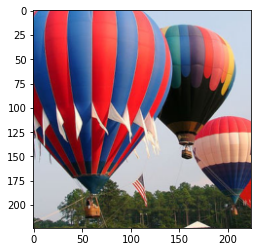

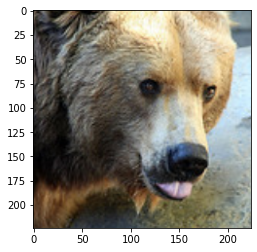

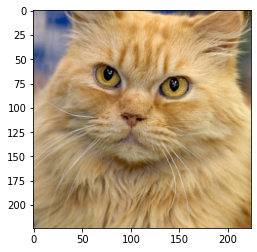

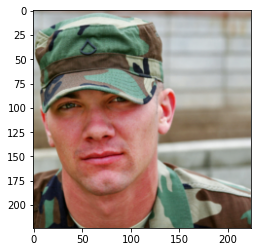

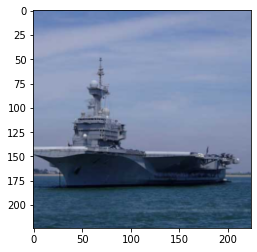

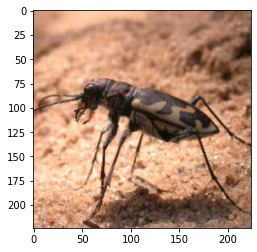

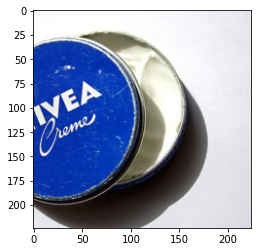

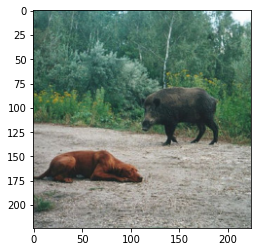

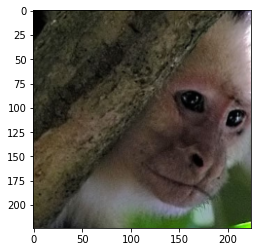

In [64]:
input_image_names = os.listdir('imagenet-sample-images-master/samples')
input_label_names = [' '.join(x.split('.')[-2].split('_')[1:]) for x in input_image_names]
new_images = np.zeros((len(input_image_names),1,224,224,3))
for i, img in enumerate(input_image_names):
    input_image = Image.open(f'imagenet-sample-images-master/samples/{img}')
    input_tensor = preprocess1(input_image)
    input_batch = input_tensor.unsqueeze(0)
    orig_img = np.asarray(transforms.ToPILImage()(input_batch[0]).convert("RGB"), dtype=np.uint8)
    left_eye_img =  orig_img.copy()
    right_eye_img =  orig_img.copy()
    nose_img =  orig_img.copy()
    new_images[i,0,:,:,:] = orig_img
    

new_images_pil = []
        
for i in range(len(input_image_names)):
    new_images_pil.append([])
    new_img = new_images[i,0]
    new_images_pil[i].append(Image.fromarray(new_images[i,0].astype('uint8')))
    plt.imshow(new_img.astype('uint8'))
    plt.show()

In [ ]:
categories = np.array(categories)
for i in enumerate(input_label_names):
    print(i[1], np.argwhere(categories==i[1]))


balloon [[417]]
brown bear [[294]]
Persian cat [[283]]
military uniform [[652]]
aircraft carrier [[403]]
tiger beetle [[300]]
lotion [[631]]
wild boar [[342]]
capuchin [[378]]


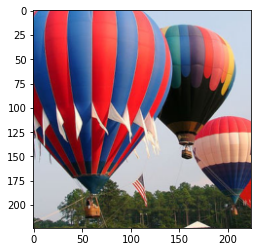

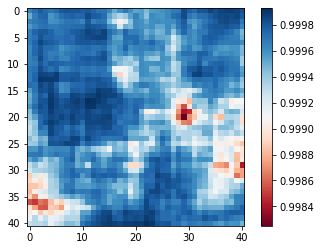

[0]


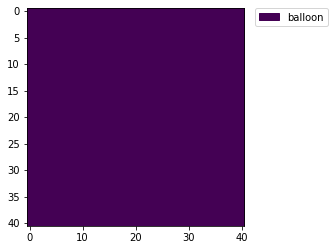

[417.] ['balloon']


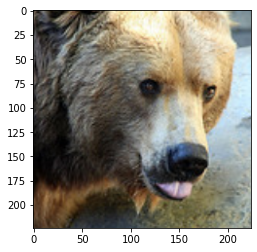

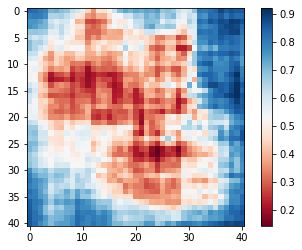

[0 1 2 3]


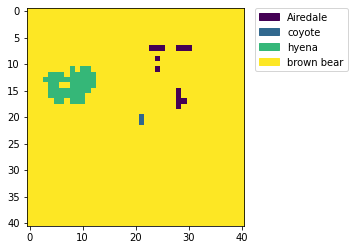

[191. 272. 276. 294.] ['Airedale' 'brown bear' 'coyote' 'hyena']


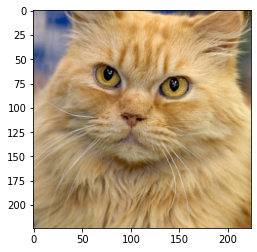

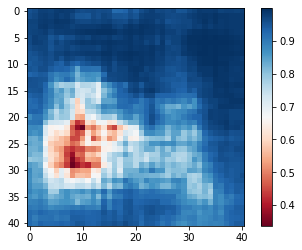

[0]


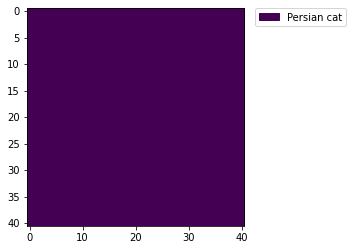

[283.] ['Persian cat']


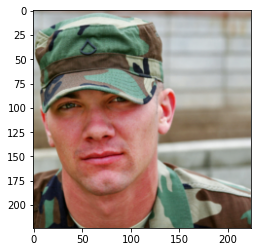

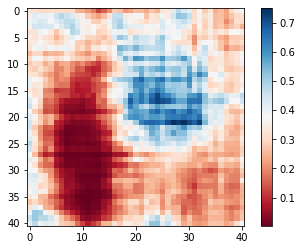

[0 1 2 3 4 5]


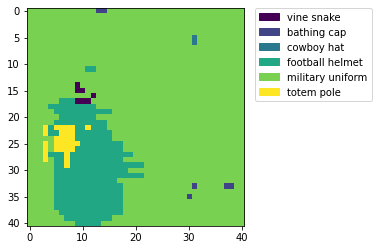

[ 59. 433. 515. 560. 652. 863.] ['bathing cap' 'cowboy hat' 'football helmet' 'military uniform'
 'totem pole' 'vine snake']


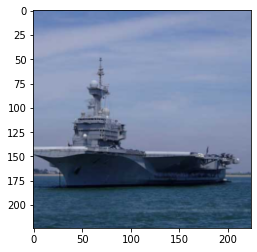

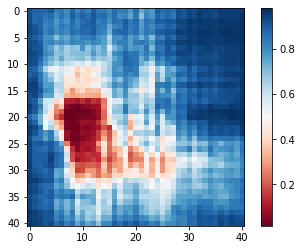

[0 1 2 3]


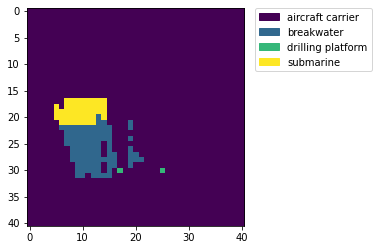

[403. 460. 540. 833.] ['aircraft carrier' 'breakwater' 'drilling platform' 'submarine']


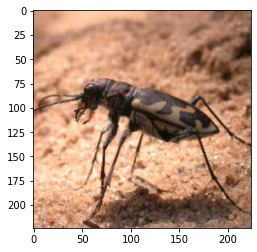

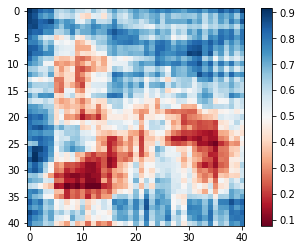

[0 1 2 3]


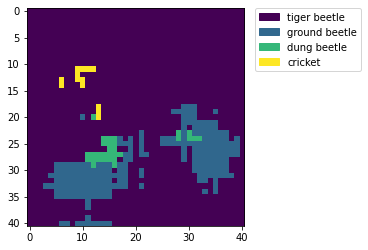

[300. 302. 305. 312.] ['cricket' 'dung beetle' 'ground beetle' 'tiger beetle']


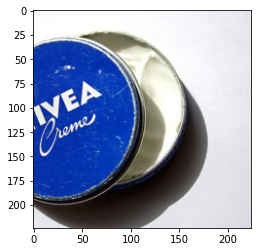

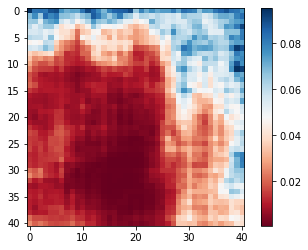

[0 1 2 3 4 5 6]


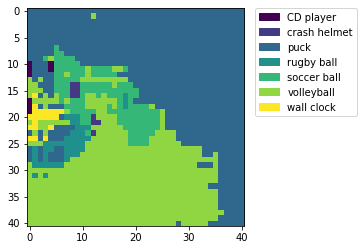

[485. 518. 746. 768. 805. 890. 892.] ['CD player' 'crash helmet' 'puck' 'rugby ball' 'soccer ball' 'volleyball'
 'wall clock']


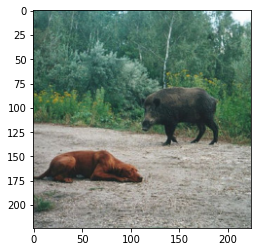

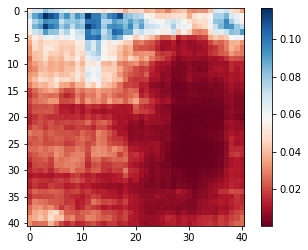

[0 1 2 3 4 5 6 7 8 9]


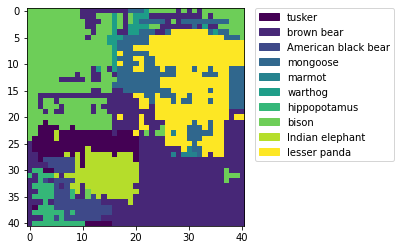

[101. 294. 295. 298. 336. 343. 344. 347. 385. 387.] ['American black bear' 'Indian elephant' 'bison' 'brown bear'
 'hippopotamus' 'lesser panda' 'marmot' 'mongoose' 'tusker' 'warthog']


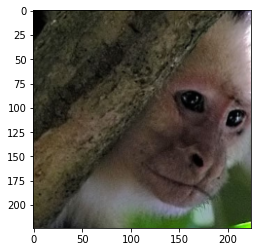

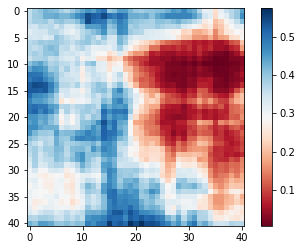

[0 1 2 3 4]


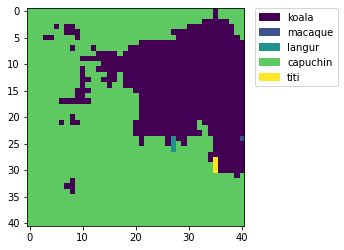

[105. 373. 374. 378. 380.] ['capuchin' 'koala' 'langur' 'macaque' 'titi']


In [117]:
for i in range(len(input_label_names)):
    plot_occlusion_plots(new_images[i][0],classnum=np.argwhere(categories==input_label_names[i])[0][0])